<a href="https://colab.research.google.com/github/peyman886/Deep_Learning_course/blob/main/HW3/HW3_Q3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Information

## **Student Information:**
* Name = Peyman
* Last Name = Naseri
* Student ID = 96100522

## **HomeWork Information:**
* Course = Deep Learning
* Home Work = 3
* Question = 3
* colab = https://colab.research.google.com/drive/1RK9JDLGHly6RLCciKpm95RwJSu9FGxaA?usp=sharing
* github = https://github.com/peyman886/Deep_Learning_course/HW3/HW3_Q3.ipynb

# setting gpu

In [ ]:
'''
  https://research.google.com/colaboratory/local-runtimes.html
  
  for run code on local gpu:
    run this comand in anaconda prompet:
      1) pip install jupyter_http_over_ws
      2) jupyter serverextension enable --py jupyter_http_over_ws
      3) jupyter notebook --NotebookApp.allow_origin='https://colab.research.google.com' --port=8888 --NotebookApp.port_retries=0

pip install jupyter_http_over_ws
jupyter serverextension enable --py jupyter_http_over_ws
jupyter notebook --NotebookApp.allow_origin='https://colab.research.google.com' --port=8888 --NotebookApp.port_retries=0

    copy url and paste on colab

'''


import torch
#Check GPU
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 2080 with Max-Q Design'

# Data


## <h2> Exploring the dataset</h2>


<p>Reading the image data and their corresponding captions from the flick dataset folder. Showing the image and captions to get the insighs of the data.

In [ ]:
#location of the data 
data_location =  "./input"
!ls $data_location

captions.txt  Images


In [ ]:
#reading the text data 
import pandas as pd
caption_file = data_location + '/captions.txt'
df = pd.read_csv(caption_file)
print("There are {} image to captions".format(len(df)))
df.head(7)

There are 40455 image to captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...


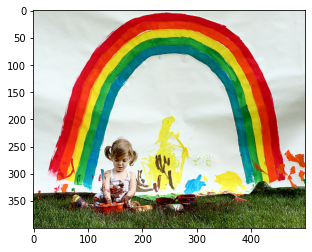

Caption: A little girl is sitting in front of a large painted rainbow .
Caption: A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .
Caption: There is a girl with pigtails sitting in front of a rainbow painting .
Caption: Young girl with pigtails painting outside in the grass .
Caption: A man lays on a bench while his dog sits by him .


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#select any index from the whole dataset 
#single image has 5 captions
#so, select indx as: 1,6,11,16...
data_idx = 11

#eg path to be plot: ../input/flickr8k/Images/1000268201_693b08cb0e.jpg
image_path = data_location+"/Images/"+df.iloc[data_idx,0]
img=mpimg.imread(image_path)
plt.imshow(img)
plt.show()

#image consits of 5 captions,
#showing all 5 captions of the image of the given idx 
for i in range(data_idx,data_idx+5):
    print("Caption:",df.iloc[i,1])


## <h2> Writing the custom dataset</h2>


<p>Writing the custom torch dataset class so, that we can abastract out the dataloading steps during the training and validation process</p>
<p>Here, dataloader is created which gives the batch of image and its captions with following processing done:</p>

<li>caption word tokenized to unique numbers</li>
<li>vocab instance created to store all the relivent words in the datasets</li>
<li>each batch, caption padded to have same sequence length</li>
<li>image resized to the desired size and converted into captions</li>

<br><p>In this way the dataprocessing is done, and the dataloader is ready to be used with <b>Pytorch</b></p>

In [ ]:
# ! pip install spacy

### imports  

In [ ]:
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

from PIL import Image

### spacy
using spacy for the better text tokenization 


In [ ]:
spacy_eng = spacy.load("en_core_web_sm")

#example
text = "This is a good place to find a city"
[token.text.lower() for token in spacy_eng.tokenizer(text)]

['this', 'is', 'a', 'good', 'place', 'to', 'find', 'a', 'city']

### vicab class 

In [ ]:
class Vocabulary:
    def __init__(self,freq_threshold):
        #setting the pre-reserved tokens int to string tokens
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}
        
        #string to int tokens
        #its reverse dict self.itos
        self.stoi = {v:k for k,v in self.itos.items()}
        
        self.freq_threshold = freq_threshold
        
    def __len__(self): return len(self.itos)
    
    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]
    
    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4
        
        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1
                
                #add the word to the vocab if it reaches minum frequecy threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1
    
    def numericalize(self,text):
        """ For each word in the text corresponding index token for that word form the vocab built as list """
        tokenized_text = self.tokenize(text)
        return [ self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text ]    

#### testing the vicab class  

In [ ]:
v = Vocabulary(freq_threshold=1)

v.build_vocab(["This is a good place to find a city"])
print(v.stoi)
print(v.numericalize("This is a good place to find a city here!!"))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'this': 4, 'is': 5, 'a': 6, 'good': 7, 'place': 8, 'to': 9, 'find': 10, 'city': 11}
[4, 5, 6, 7, 8, 9, 10, 6, 11, 3, 3, 3]


In [ ]:
class FlickrDataset(Dataset):
    """
    FlickrDataset
    """
    def __init__(self,root_dir,captions_file,transform=None,freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(caption_file)
        self.transform = transform
        
        #Get image and caption colum from the dataframe
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]
        
        #Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())
        
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self,idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir,img_name)
        img = Image.open(img_location).convert("RGB")
        
        #apply the transfromation to the image
        if self.transform is not None:
            img = self.transform(img)
        
        #numericalize the caption text
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]
        
        return img, torch.tensor(caption_vec)

In [ ]:
# defing the transform to apply on data
transforms = T.Compose([
    T.Resize((224,224)),
    T.ToTensor()
])

In [ ]:
# function for show image with captions
def show_image(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

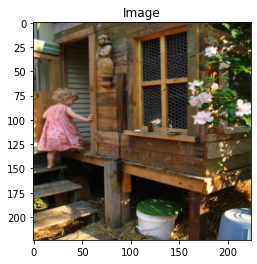

Token: tensor([  1,   4,  28,   8,   4, 195, 151,  17,  32,  67,   4, 353,  11, 711,
          8,  24,   3, 496,   5,   2])
Sentence:
['<SOS>', 'a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', '<UNK>', 'way', '.', '<EOS>']


In [ ]:
# testing the dataset class
dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)

img, caps = dataset[0]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

### data loader

In [ ]:
class CapsCollate:
    """
    Collate to apply the padding to the captions with dataloader
    """
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first
    
    def __call__(self,batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)
        
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

In [ ]:
#writing the dataloader
#setting the constants
BATCH_SIZE = 4
# NUM_WORKER = 1
NUM_WORKER = 10  

#token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

# data_loader = DataLoader(
#     dataset=dataset,
#     batch_size=BATCH_SIZE,
#     num_workers=NUM_WORKER,
#     shuffle=True,
#     collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
# )
def get_data_loader(dataset=dataset, batch_size=BATCH_SIZE, num_workers=NUM_WORKER,shuffle=True):
    data_loader = DataLoader(
    dataset=dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
    )
    return data_loader

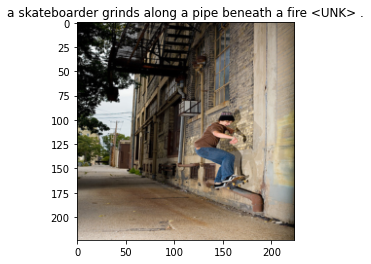

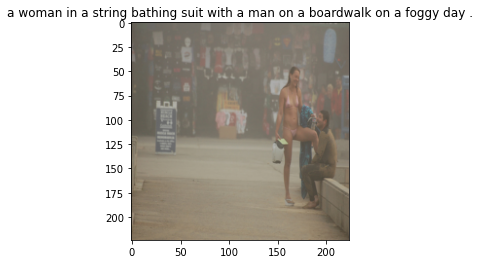

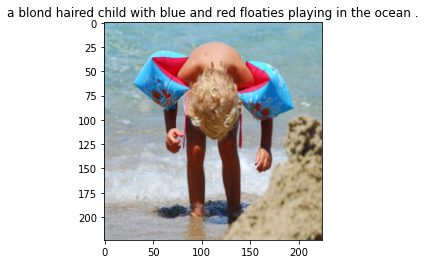

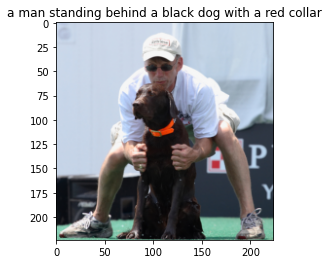

In [ ]:
data_loader = get_data_loader()
#generating the iterator from the dataloader
dataiter = iter(data_loader)

#getting the next batch
batch = next(dataiter)

#unpacking the batch
images, captions = batch

#showing info of image in single batch
for i in range(BATCH_SIZE):
    img,cap = images[i],captions[i]
    caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)                      
    show_image(img,caption_label)
    plt.show()
    print()

# Model

## Initial Imports

In [ ]:
#location of the training data 
data_location =  "./input"
#copy dataloader
# !cp ./input/data-loader/data_loader.py .

#imports
import time
import numpy as np
import torch
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

#custom imports 
# from data_loader import FlickrDataset,get_data_loader

## Implementing the Helper function to plot the Tensor image

### show the tensor image

In [ ]:

import matplotlib.pyplot as plt
def show_image(img, title=None):
    """Imshow for Tensor."""
    
    #unnormalize 
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224 
    img[2] = img[2] * 0.225 
    img[0] += 0.485 
    img[1] += 0.456 
    img[2] += 0.406
    
    img = img.numpy().transpose((1, 2, 0))
    
    
    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

### Initiate the Dataset and Dataloader


In [ ]:

#setting the constants
data_location =  "./input"
BATCH_SIZE = 256
# BATCH_SIZE = 6
# NUM_WORKER = 4
NUM_WORKER = 10

#defining the transform to be applied
transforms = T.Compose([
    T.Resize(226),                     
    T.RandomCrop(224),                 
    T.ToTensor(),                               
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])


#testing the dataset class
dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)

#writing the dataloader
data_loader = get_data_loader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    # batch_first=False
)

#vocab_size
vocab_size = len(dataset.vocab)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

## Defining the Model Architecture


Model is seq2seq model. In the **encoder** pretrained ResNet model is used to extract the features. Decoder, is the implementation of the Bahdanau Attention Decoder. In the decoder model **LSTM cell**.

### import

In [ ]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

### encoder

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)
        
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)
        

    def forward(self, images):
        features = self.resnet(images)                                    #(batch_size,2048,7,7)
        features = features.permute(0, 2, 3, 1)                           #(batch_size,7,7,2048)
        features = features.view(features.size(0), -1, features.size(-1)) #(batch_size,49,2048)
        return features


In [ ]:
#Bahdanau Attention
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()
        
        self.attention_dim = attention_dim
        
        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)
        
        self.A = nn.Linear(attention_dim,1)
        
        
        
        
    def forward(self, features, hidden_state):
        u_hs = self.U(features)     #(batch_size,num_layers,attention_dim)
        w_ah = self.W(hidden_state) #(batch_size,attention_dim)
        
        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) #(batch_size,num_layers,attemtion_dim)
        
        attention_scores = self.A(combined_states)         #(batch_size,num_layers,1)
        attention_scores = attention_scores.squeeze(2)     #(batch_size,num_layers)
        
        
        alpha = F.softmax(attention_scores,dim=1)          #(batch_size,num_layers)
        
        attention_weights = features * alpha.unsqueeze(2)  #(batch_size,num_layers,features_dim)
        attention_weights = attention_weights.sum(dim=1)   #(batch_size,num_layers)
        
        return alpha,attention_weights
        

### decoder

In [ ]:
#Attention Decoder
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        
        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim
        
        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = Attention(encoder_dim,decoder_dim,attention_dim)
        
        
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        
        
        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)
        
        
    
    def forward(self, features, captions):
        
        #vectorize the caption
        embeds = self.embedding(captions)
        
        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)
        
        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)
                
        for s in range(seq_length):
            alpha,context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
                    
            output = self.fcn(self.drop(h))
            
            preds[:,s] = output
            alphas[:,s] = alpha  
        
        
        return preds, alphas
    
    def generate_caption(self,features,max_len=20,vocab=None):
        # Inference part
        # Given the image features generate the captions
        
        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        alphas = []
        
        #starting input
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)

        
        captions = []
        
        for i in range(max_len):
            alpha,context = self.attention(features, h)
            
            
            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())
            
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)
        
            
            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)
            
            #save the generated word
            captions.append(predicted_word_idx.item())
            
            #end if <EOS detected>
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))
        
        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions],alphas
    
    
    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c


### ecoder-decoder

In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )
        
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs


### 4) Setting Hypperparameter and Init the model

In [ ]:
#Hyperparams
embed_size=300
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4


In [ ]:
#init model
model = EncoderDecoder(
    embed_size=300,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
#helper function to save the model
def save_model(model,num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }

    torch.save(model_state,'attention_model_state.pth')

## Training Job from above configs

Epoch: 1 loss: 4.25355 runtime: 95.98


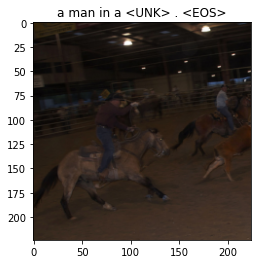

Epoch: 2 loss: 3.65296 runtime: 98.73


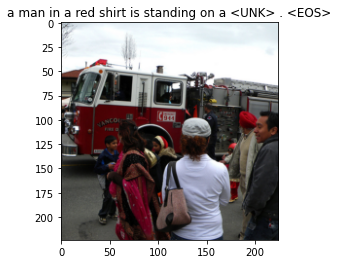

Epoch: 3 loss: 3.24511 runtime: 103.13


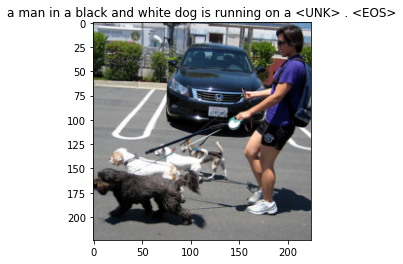

Epoch: 4 loss: 3.08206 runtime: 105.02


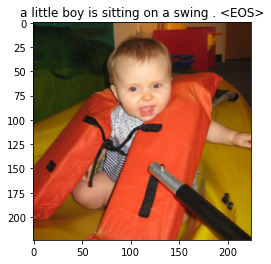

Epoch: 5 loss: 2.87146 runtime: 105.44


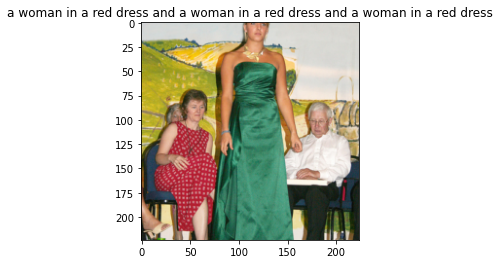

Epoch: 6 loss: 2.80245 runtime: 115.59


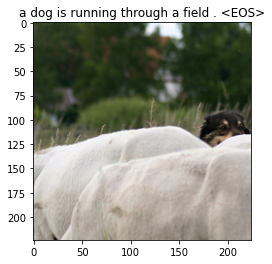

Epoch: 7 loss: 2.75616 runtime: 108.76


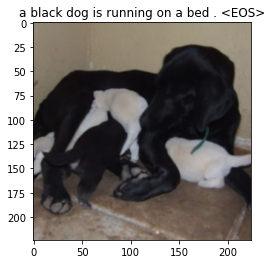

Epoch: 8 loss: 2.68902 runtime: 115.90


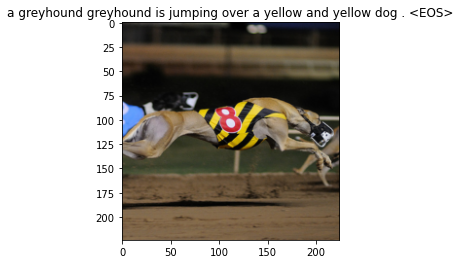

Epoch: 9 loss: 2.49991 runtime: 119.86


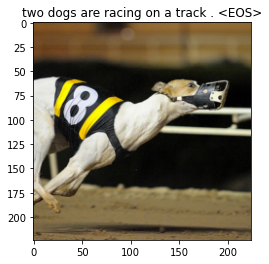

Epoch: 10 loss: 2.59878 runtime: 116.12


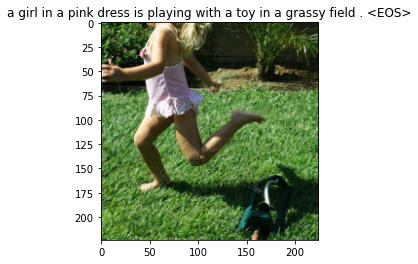

Epoch: 11 loss: 2.52369 runtime: 118.20


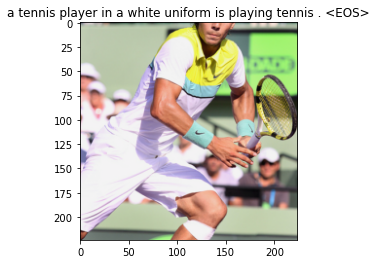

Epoch: 12 loss: 2.49877 runtime: 117.54


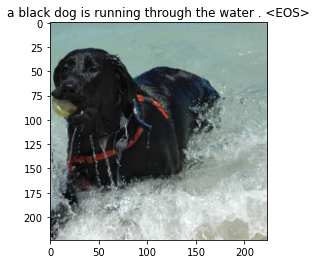

Epoch: 13 loss: 2.45469 runtime: 108.82


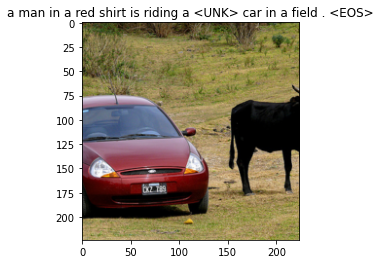

Epoch: 14 loss: 2.35781 runtime: 107.70


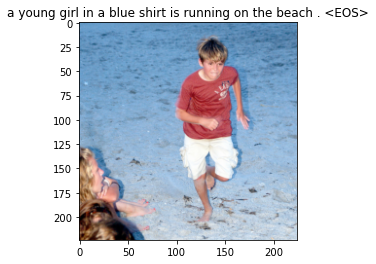

Epoch: 15 loss: 2.34646 runtime: 105.89


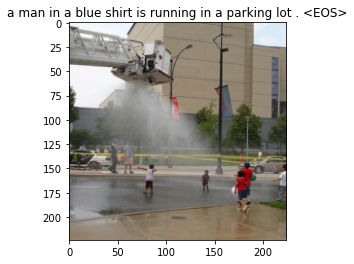

Epoch: 16 loss: 2.32481 runtime: 114.45


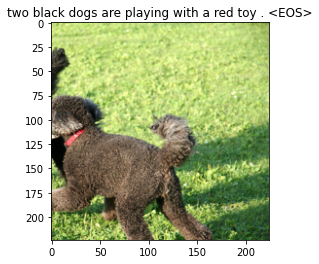

Epoch: 17 loss: 2.25514 runtime: 108.16


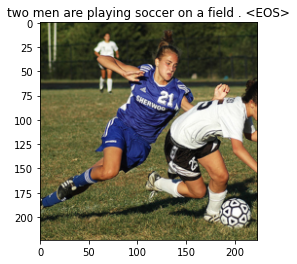

Epoch: 18 loss: 2.24502 runtime: 114.89


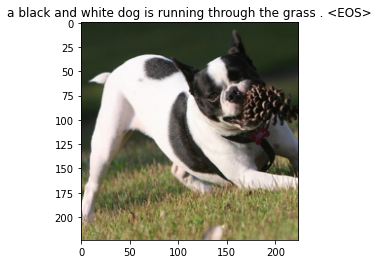

Epoch: 19 loss: 2.16984 runtime: 110.58


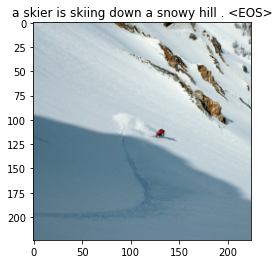

Epoch: 20 loss: 2.21819 runtime: 116.55


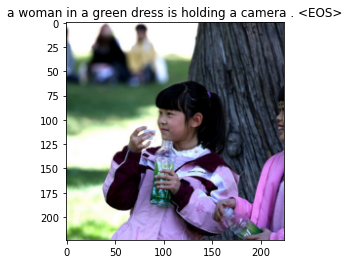

Epoch: 21 loss: 2.17733 runtime: 111.29


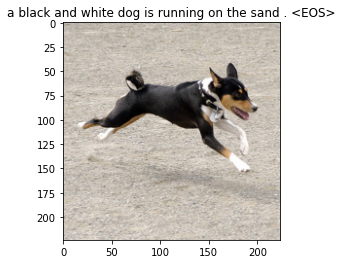

Epoch: 22 loss: 2.13446 runtime: 112.63


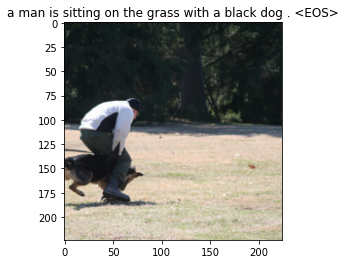

Epoch: 23 loss: 2.16704 runtime: 105.89


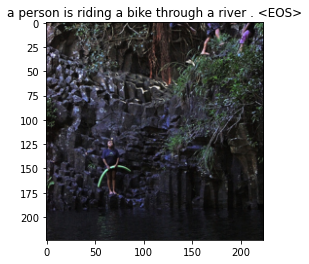

Epoch: 24 loss: 2.13388 runtime: 104.53


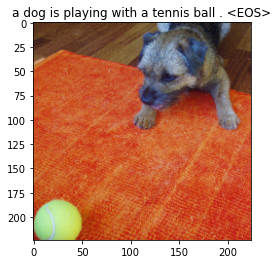

Epoch: 25 loss: 2.14234 runtime: 110.30


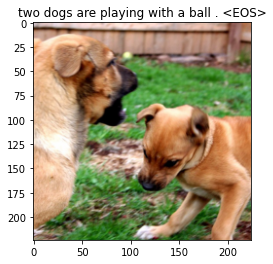

Epoch: 26 loss: 2.06496 runtime: 111.85


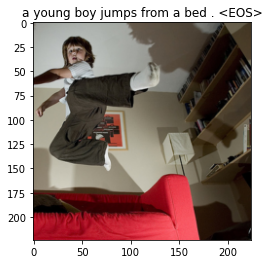

Epoch: 27 loss: 2.02220 runtime: 104.52


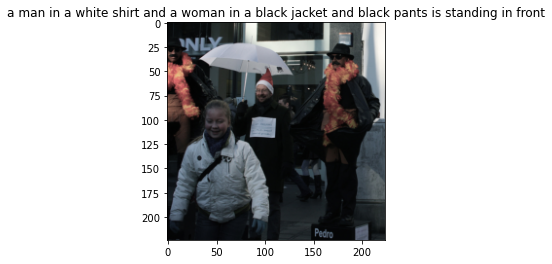

Epoch: 28 loss: 1.96888 runtime: 104.26


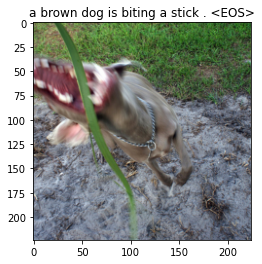

Epoch: 29 loss: 2.04471 runtime: 103.76


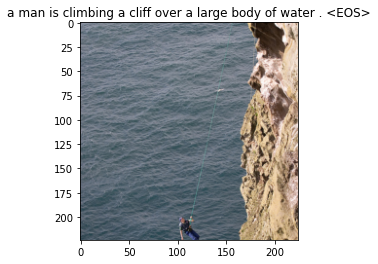

Epoch: 30 loss: 2.05428 runtime: 103.48


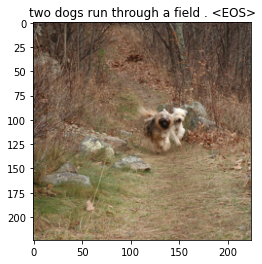

Epoch: 31 loss: 1.98812 runtime: 108.29


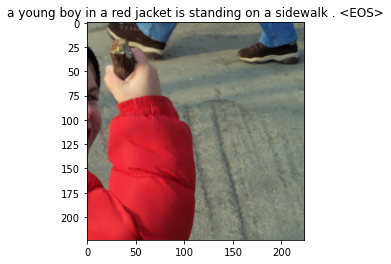

Epoch: 32 loss: 2.01467 runtime: 102.71


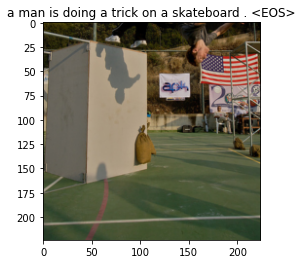

Epoch: 33 loss: 2.08291 runtime: 106.09


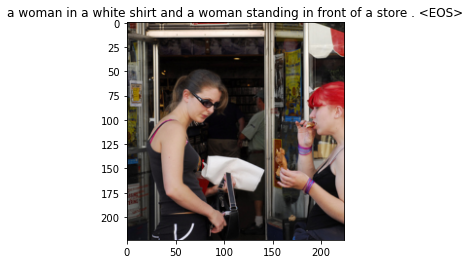

Epoch: 34 loss: 1.95317 runtime: 106.22


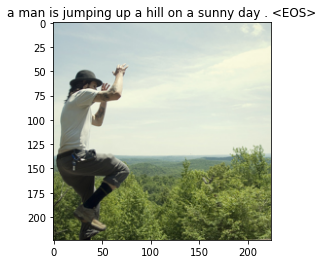

Epoch: 35 loss: 1.93498 runtime: 101.24


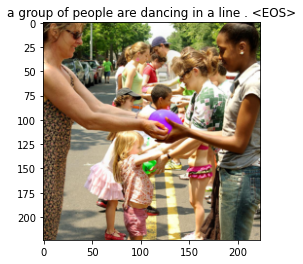

Epoch: 36 loss: 1.89863 runtime: 102.11


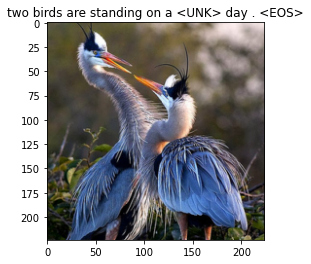

Epoch: 37 loss: 1.86736 runtime: 106.91


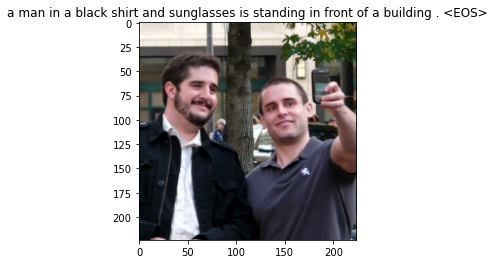

Epoch: 38 loss: 1.93869 runtime: 105.74


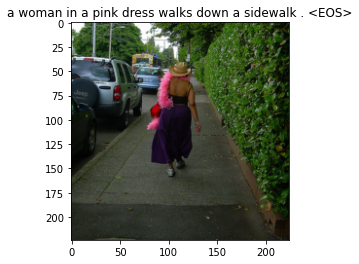

Epoch: 39 loss: 1.88515 runtime: 100.26


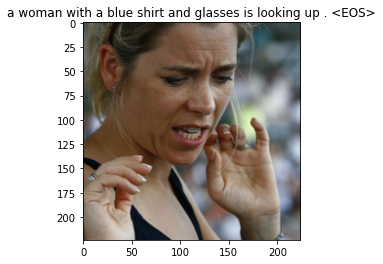

Epoch: 40 loss: 1.85109 runtime: 106.25


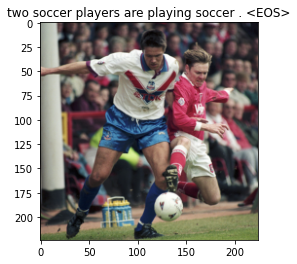

Epoch: 41 loss: 1.79479 runtime: 100.84


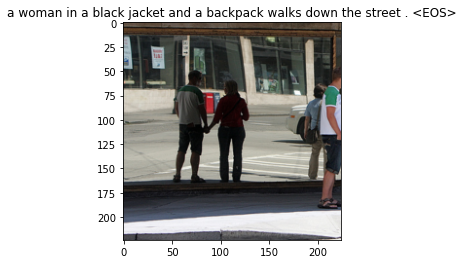

Epoch: 42 loss: 1.78006 runtime: 105.54


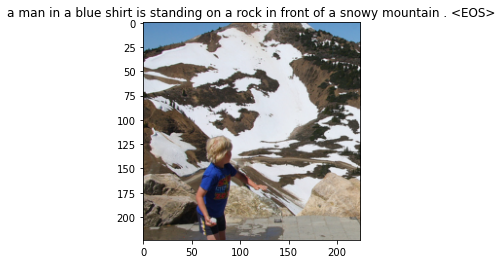

Epoch: 43 loss: 1.78658 runtime: 101.59


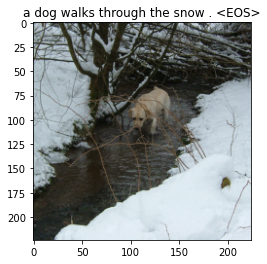

Epoch: 44 loss: 1.76872 runtime: 106.00


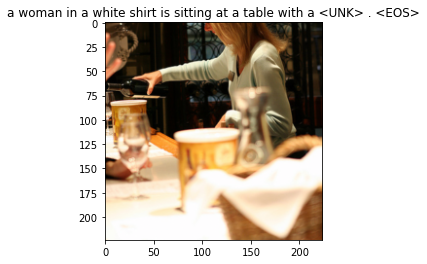

Epoch: 45 loss: 1.80952 runtime: 102.47


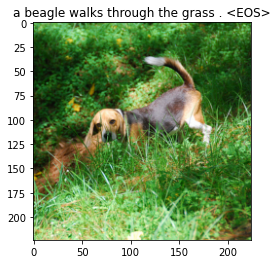

Epoch: 46 loss: 1.75940 runtime: 106.79


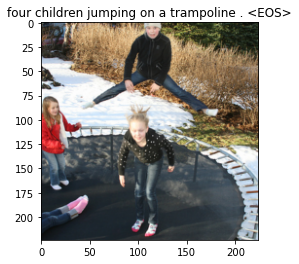

Epoch: 47 loss: 1.76209 runtime: 106.50


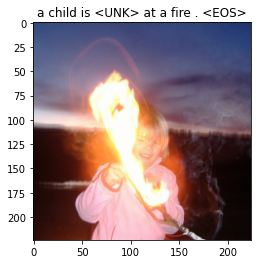

Epoch: 48 loss: 1.75377 runtime: 105.38


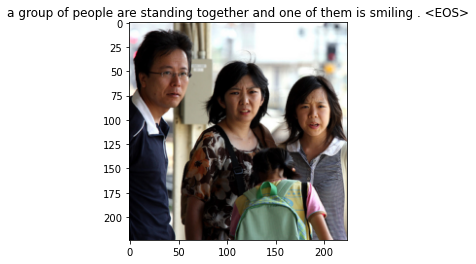

Epoch: 49 loss: 1.72227 runtime: 101.97


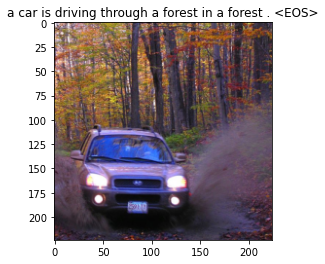

Epoch: 50 loss: 1.70314 runtime: 106.64


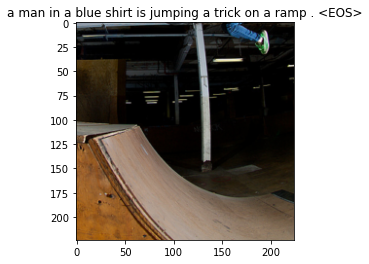

Epoch: 51 loss: 1.75733 runtime: 105.29


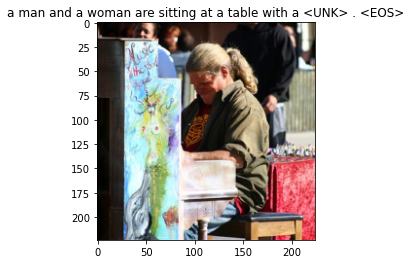

Epoch: 52 loss: 1.68105 runtime: 105.13


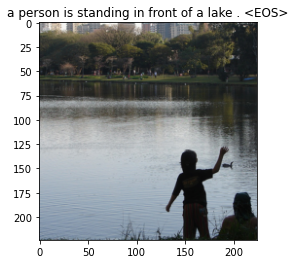

Epoch: 53 loss: 1.70009 runtime: 100.84


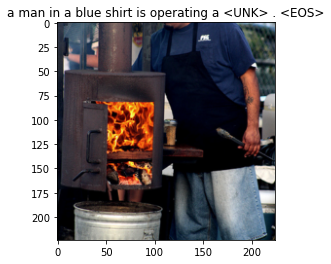

Epoch: 54 loss: 1.66986 runtime: 100.51


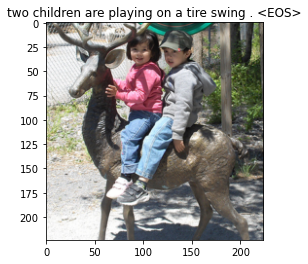

Epoch: 55 loss: 1.63716 runtime: 108.17


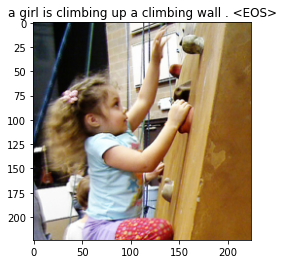

Epoch: 56 loss: 1.62825 runtime: 107.42


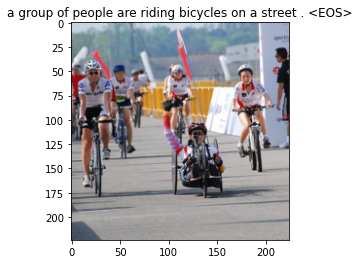

Epoch: 57 loss: 1.65668 runtime: 106.59


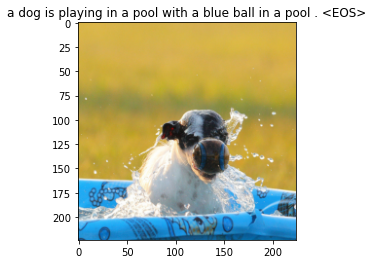

Epoch: 58 loss: 1.64836 runtime: 100.84


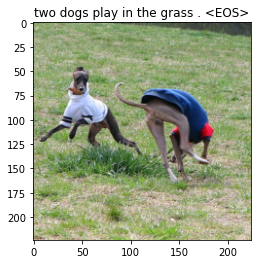

Epoch: 59 loss: 1.58585 runtime: 105.60


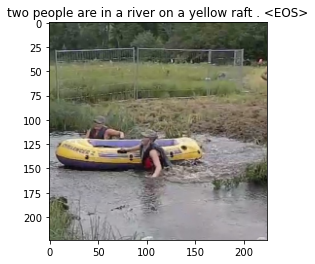

Epoch: 60 loss: 1.62013 runtime: 106.34


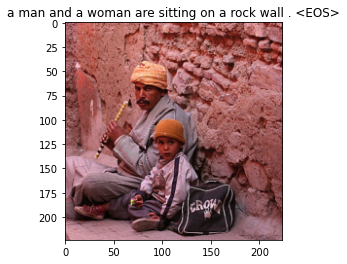

Epoch: 61 loss: 1.58109 runtime: 104.96


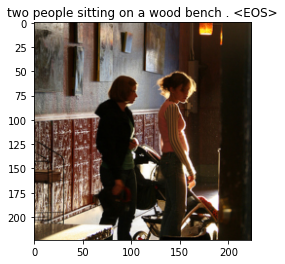

Epoch: 62 loss: 1.59569 runtime: 101.33


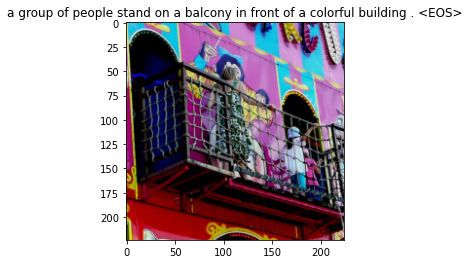

Epoch: 63 loss: 1.56283 runtime: 102.76


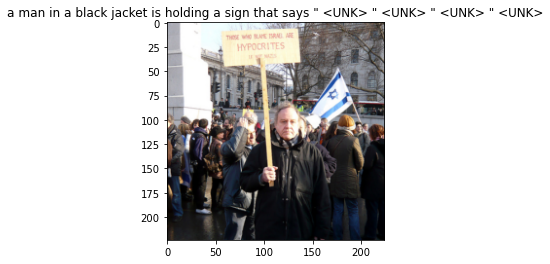

Epoch: 64 loss: 1.59694 runtime: 106.09


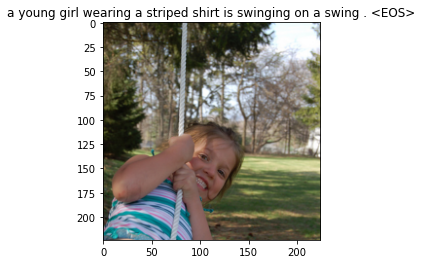

Epoch: 65 loss: 1.56639 runtime: 104.96


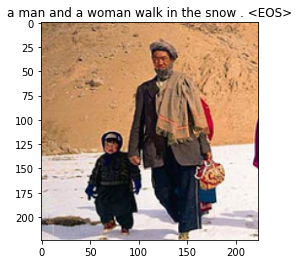

Epoch: 66 loss: 1.55868 runtime: 107.84


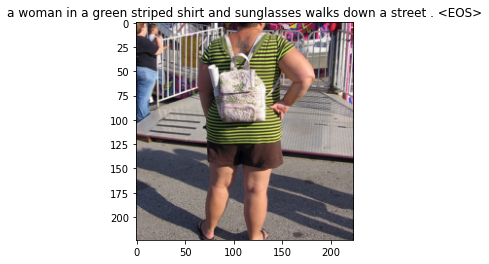

Epoch: 67 loss: 1.47972 runtime: 107.16


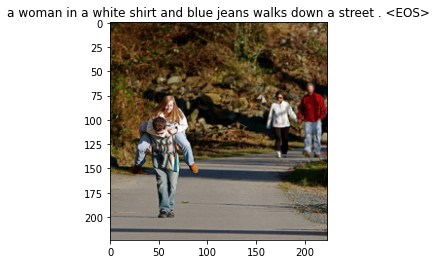

Epoch: 68 loss: 1.51734 runtime: 100.91


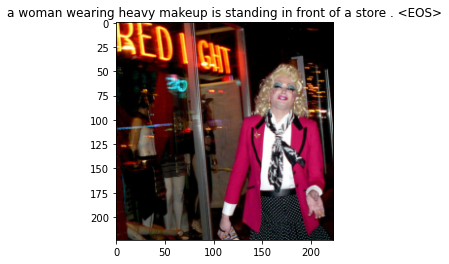

Epoch: 69 loss: 1.54309 runtime: 104.98


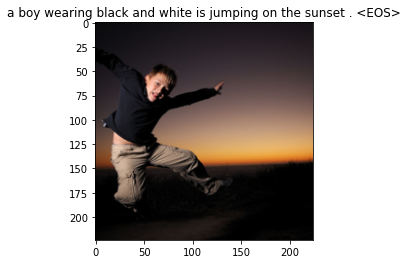

Epoch: 70 loss: 1.47808 runtime: 99.84


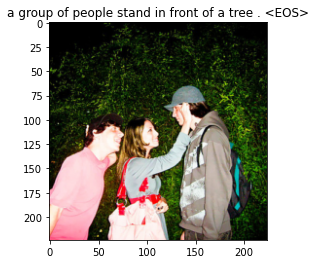

Epoch: 71 loss: 1.45689 runtime: 105.07


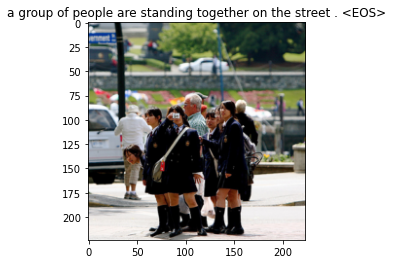

Epoch: 72 loss: 1.50000 runtime: 104.61


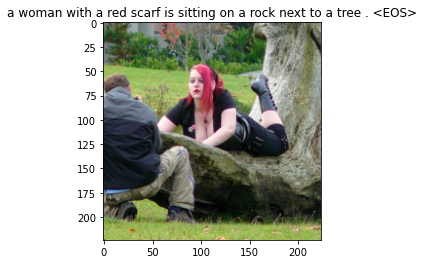

Epoch: 73 loss: 1.52453 runtime: 106.39


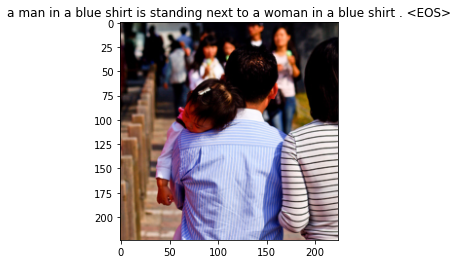

Epoch: 74 loss: 1.46888 runtime: 101.60


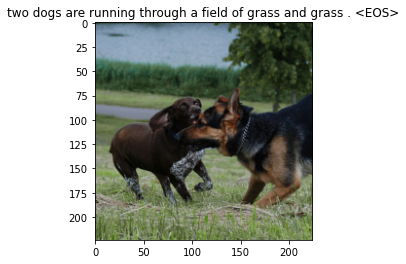

Epoch: 75 loss: 1.45068 runtime: 108.35


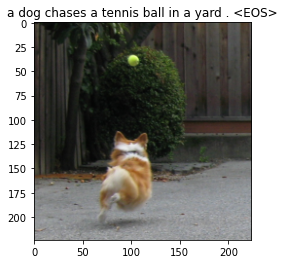

Epoch: 76 loss: 1.39317 runtime: 108.33


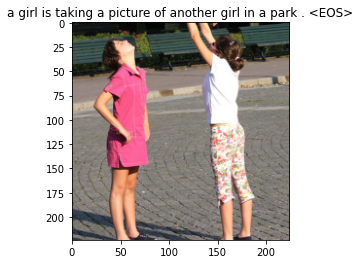

Epoch: 77 loss: 1.38228 runtime: 101.82


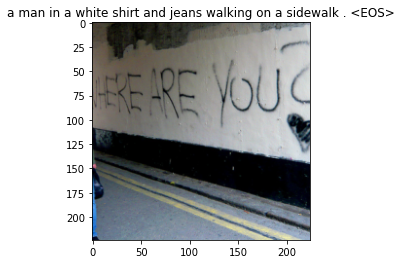

Epoch: 78 loss: 1.45121 runtime: 101.14


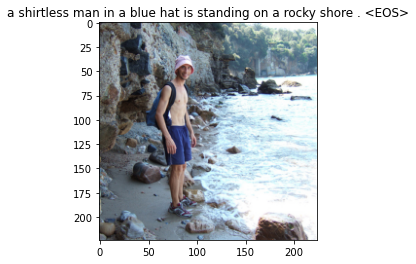

Epoch: 79 loss: 1.40050 runtime: 101.27


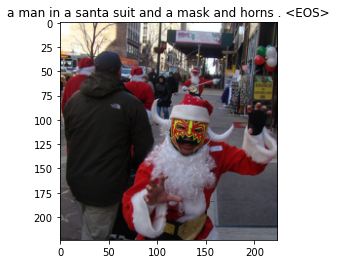

Epoch: 80 loss: 1.40157 runtime: 102.55


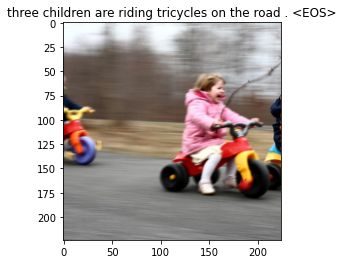

Epoch: 81 loss: 1.42375 runtime: 102.02


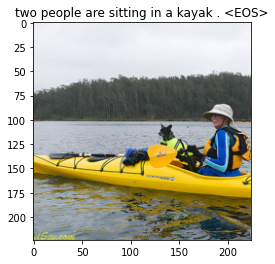

Epoch: 82 loss: 1.36766 runtime: 107.88


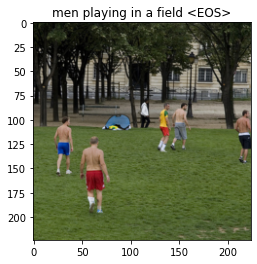

Epoch: 83 loss: 1.42542 runtime: 108.97


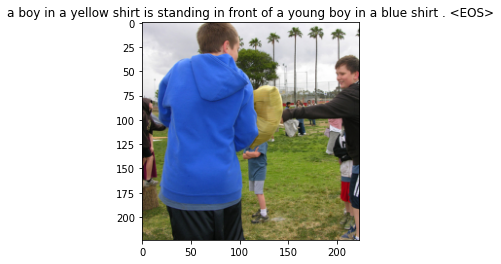

Epoch: 84 loss: 1.37992 runtime: 101.43


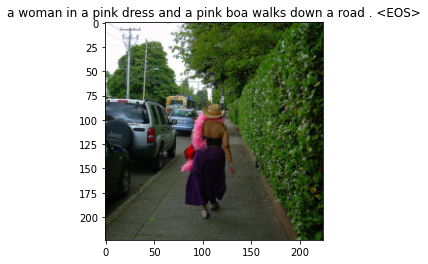

Epoch: 85 loss: 1.38553 runtime: 105.12


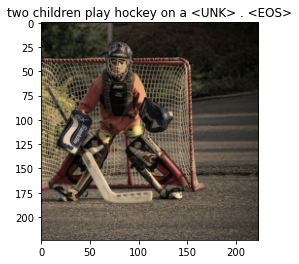

Epoch: 86 loss: 1.34750 runtime: 105.96


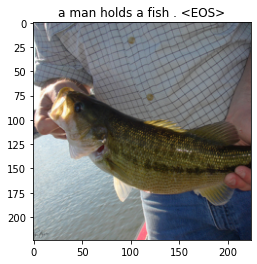

Epoch: 87 loss: 1.40279 runtime: 101.63


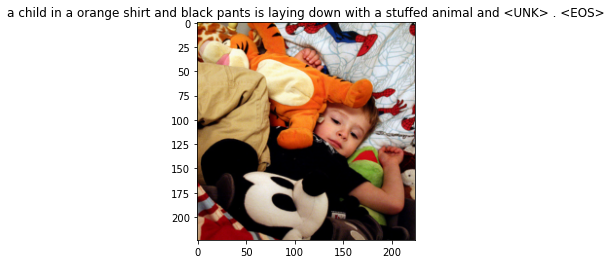

Epoch: 88 loss: 1.34426 runtime: 107.13


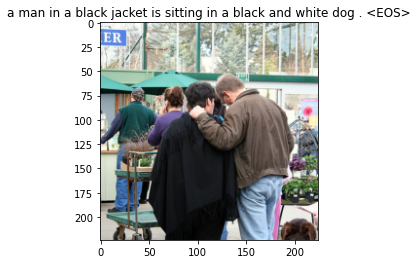

Epoch: 89 loss: 1.33313 runtime: 101.59


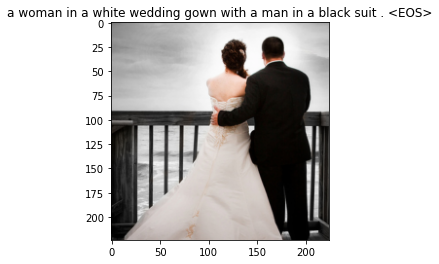

Epoch: 90 loss: 1.36530 runtime: 107.66


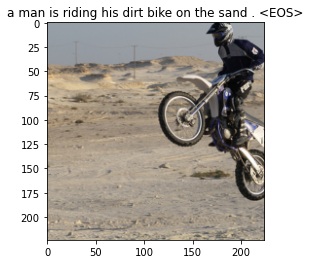

Epoch: 91 loss: 1.35422 runtime: 107.29


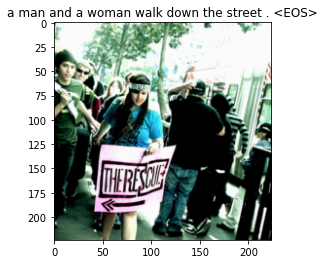

Epoch: 92 loss: 1.27605 runtime: 102.98


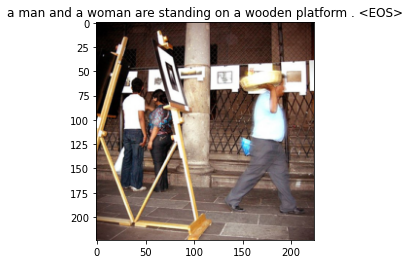

Epoch: 93 loss: 1.30267 runtime: 105.98


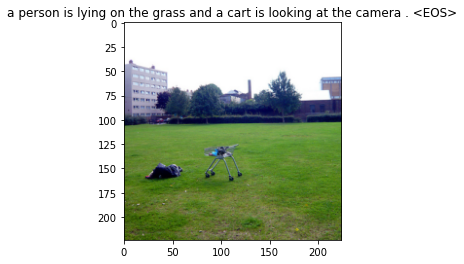

Epoch: 94 loss: 1.30461 runtime: 107.57


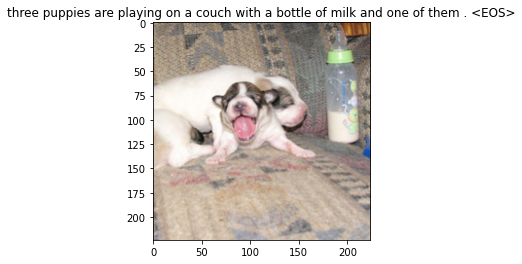

Epoch: 95 loss: 1.30699 runtime: 102.54


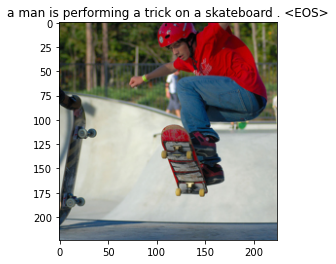

Epoch: 96 loss: 1.31010 runtime: 101.28


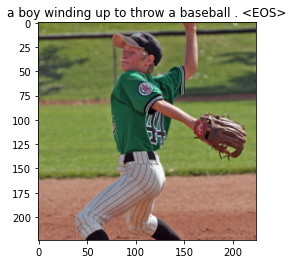

Epoch: 97 loss: 1.23285 runtime: 103.66


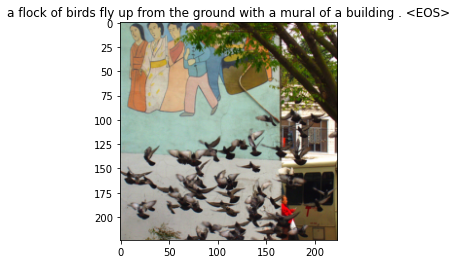

Epoch: 98 loss: 1.28903 runtime: 107.96


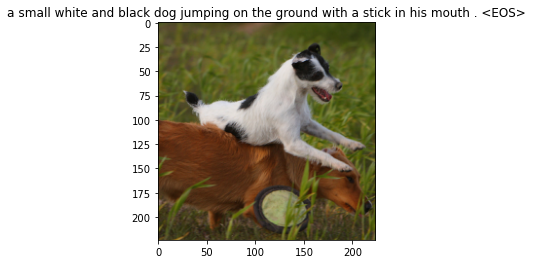

Epoch: 99 loss: 1.30232 runtime: 108.44


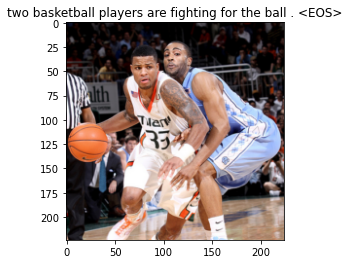

Epoch: 100 loss: 1.28113 runtime: 101.63


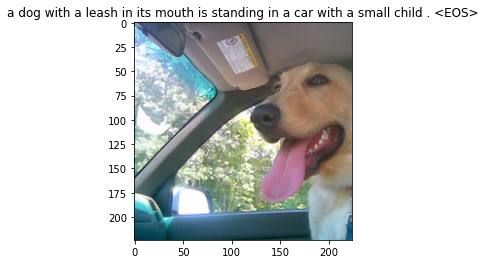

In [ ]:
num_epochs = 200
print_every = 100

for epoch in range(1,num_epochs+1): 
    t0 = time.time()  
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image,captions = image.to(device),captions.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # Feed forward
        outputs,attentions = model(image, captions)

        # Calculate the batch loss.
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
        
        # Backward pass.
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()

        if (idx+1)%print_every == 0:
            print("Epoch: {} loss: {:.5f} runtime: {:.2f}".format(epoch,loss.item(),time.time()-t0))
            
            
            #generate the caption
            model.eval()
            with torch.no_grad():
                dataiter = iter(data_loader)
                img,_ = next(dataiter)
                features = model.encoder(img[0:1].to(device))
                caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0],title=caption)
            print('\n\n\n')
                
            model.train()
        
    #save the latest model
    save_model(model,epoch)

## Visualizing the attentions


### generate caption
Given the image generate captions and attention scores


In [ ]:
def get_caps_from(features_tensors):
    #generate the caption
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0],title=caption)
    
    return caps,alphas

### Show attention
Plot the attention scores in the image


In [ ]:
def plot_attention(img, result, attention_plot):
    #untransform
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224 
    img[2] = img[2] * 0.225 
    img[0] += 0.485 
    img[1] += 0.456 
    img[2] += 0.406
    
    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)
        
        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())
        

    plt.tight_layout()
    plt.show()

### show result of a few examples

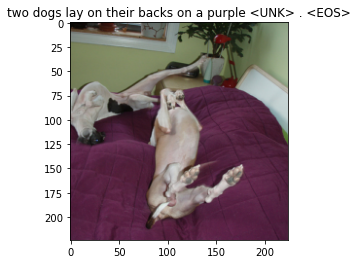

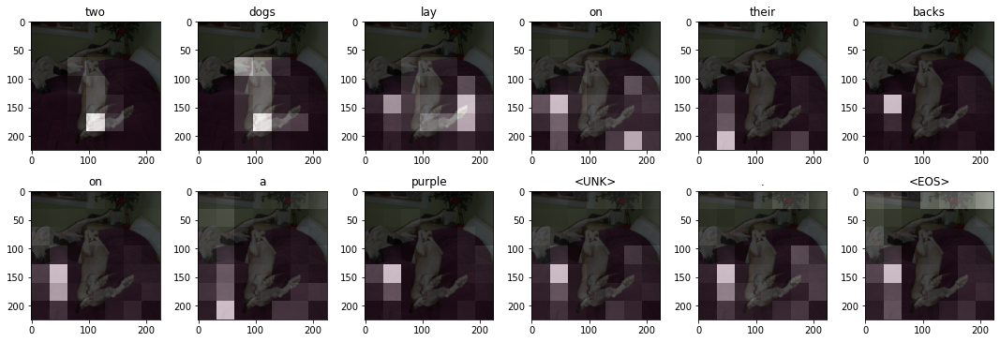

In [ ]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

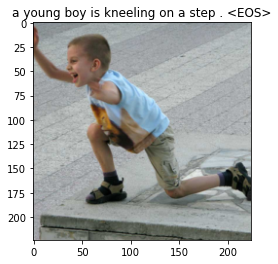

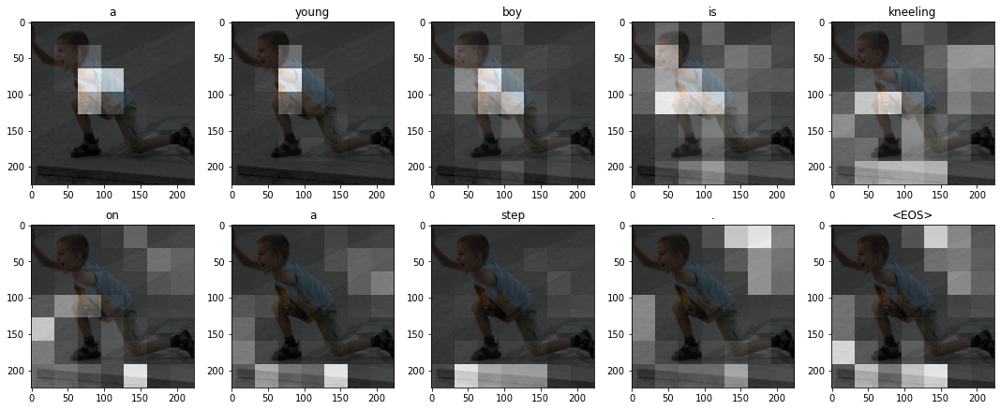

In [ ]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

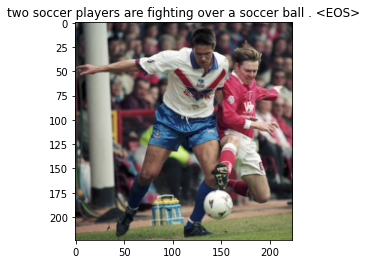

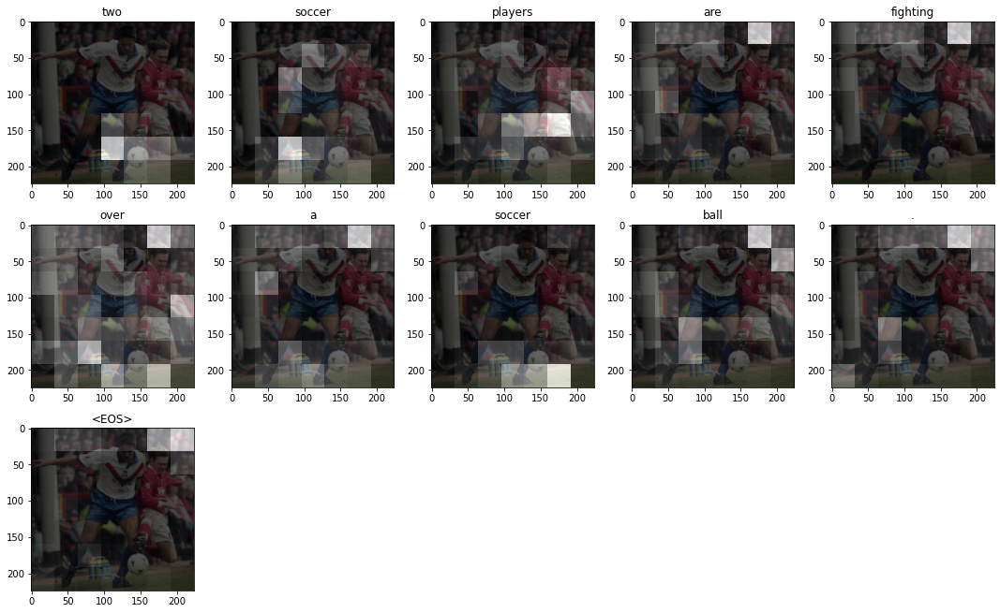

In [ ]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

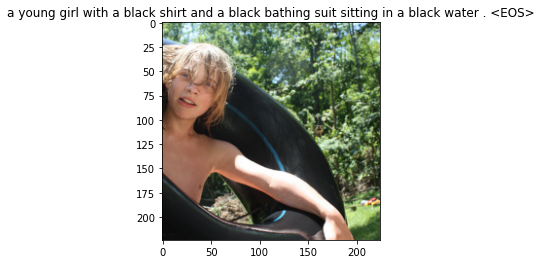

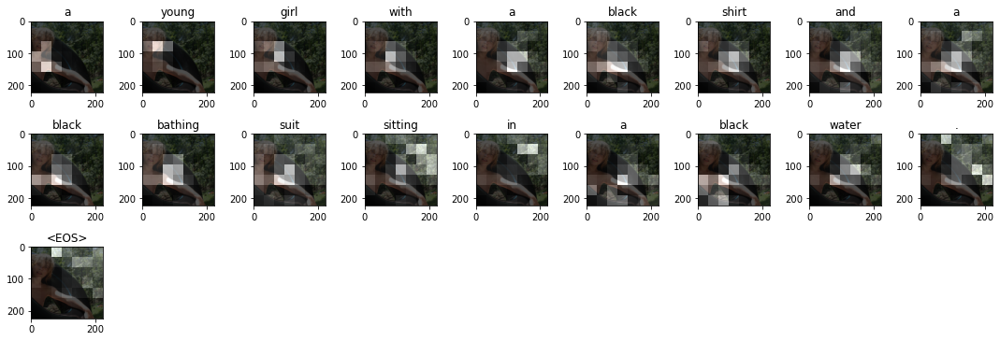

In [ ]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)